# Analysis and Visualization of Colorectal Cancer 

__Author:__ Ngoc Phuong Tran

This Jupyter Notebook will focus on analyzing spatially-resolved RNA-seq data within Scanpy.  It will cover the following tasks:
* Normalization
* Dimensional reduction and clustering
* Detecting spatially-variable features
* Interactive visualization
* Integration with single-cell RNA-seq data
* Working with multiple slices

The selection and filtration of cells based on QC metrics, data normalization and scaling, and the detection of highly variable features.

First, we load Scanpy and the other necessary packages.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns
import squidpy as sq

In [2]:
sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3

-----
anndata     0.7.5
scanpy      1.6.1.dev132+gcea278dd
sinfo       0.3.1
-----
PIL                 8.1.0
anndata             0.7.5
anyio               NA
appnope             0.1.2
attr                20.3.0
babel               2.9.0
backcall            0.2.0
bs4                 4.9.3
cairo               1.20.0
certifi             2020.12.05
cffi                1.14.4
chardet             4.0.0
constants           NA
cycler              0.10.0
cython_runtime      NA
dask                2021.01.0
dateutil            2.8.1
decorator           4.4.2
docrep              0.3.1
esda                2.3.6
get_version         2.1
h5py                3.1.0
highs_wrapper       NA
idna                2.10
igraph              0.8.3
imageio             2.9.0
ipykernel           5.4.3
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.18.0
jinja2              2.11.2
joblib              1.0.0
json5               NA
jsonschema          3.2.0
jupyter_server      1.2.2
jupyterlab

## Reading the data

Read in the count matrix into an AnnData object that contains counts, images and spatial coordinates. The data used was generated by 10xGenomics, which can be found here: https://support.10xgenomics.com/spatial-gene-expression/datasets/1.2.0/Parent_Visium_Human_ColorectalCancer. We will calculate standards QC metrics with pp.calculate_qc_metrics and percentage of mitochondrial read counts per sample.

In [3]:
adata = sc.datasets.visium_sge(sample_id="Parent_Visium_Human_ColorectalCancer")
adata.var_names_make_unique() # To make sure gene names are unique
adata.var["mt"] = adata.var_names.str.startswith("MT-") # get mitochondrial genes
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

reading /Users/phuong/data/Parent_Visium_Human_ColorectalCancer/filtered_feature_bc_matrix.h5
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:01)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [4]:
adata

AnnData object with n_obs × n_vars = 3138 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial'

## QC and preprocessing 

We perform some basic filtering of spots based on total counts and expressed genes. 

__Thresholding decision:__ counts and genes

/Applications/anaconda3/envs/py38/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Applications/anaconda3/envs/py38/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Applications/anaconda3/envs/py38/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level func

<AxesSubplot:xlabel='n_genes_by_counts'>

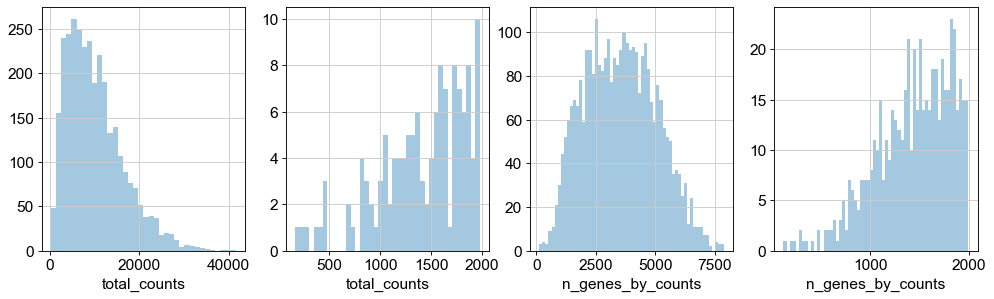

In [5]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.distplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.distplot(adata.obs["total_counts"][adata.obs["total_counts"] < 2000], kde=False, bins=40, ax=axs[1])
sns.distplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.distplot(adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 2000], kde=False, bins=60, ax=axs[3])

... storing 'feature_types' as categorical
... storing 'genome' as categorical


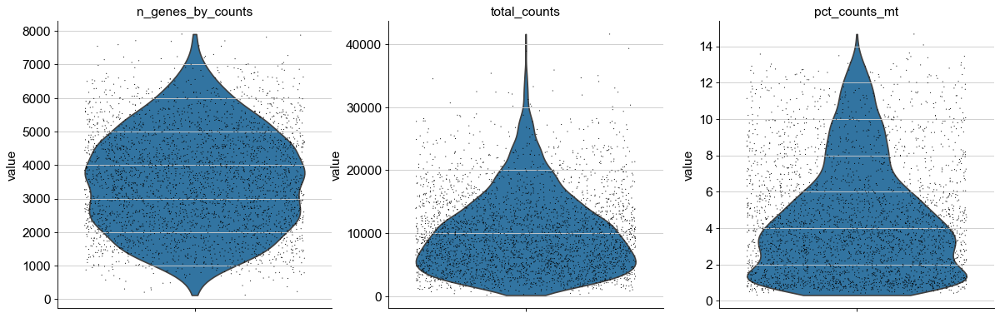

In [6]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

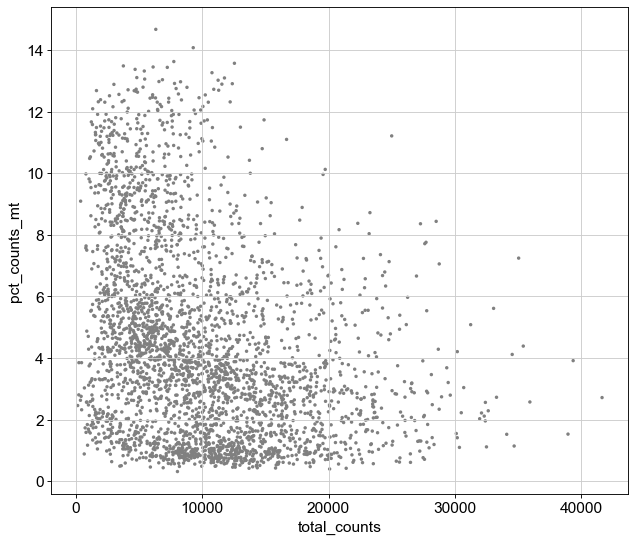

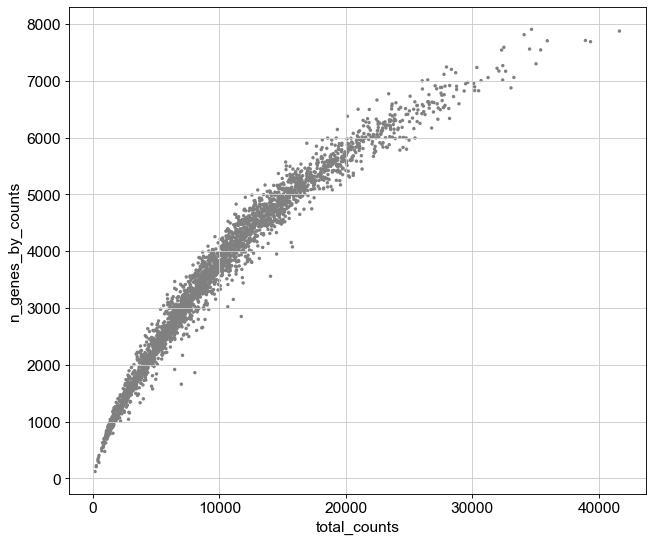

In [7]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [8]:
sc.pp.filter_cells(adata, min_counts=1000)
sc.pp.filter_cells(adata, max_counts=30000)
adata = adata[adata.obs["pct_counts_mt"] < 12]
print(f"#cells after MT filter: {adata.n_obs}")
sc.pp.filter_genes(adata, min_cells=10) # Min 10 cells - filters out 0 count genes

filtered out 21 cells that have less than 1000 counts
/Applications/anaconda3/envs/py38/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
filtered out 25 cells that have more than 30000 counts
/Applications/anaconda3/envs/py38/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


#cells after MT filter: 3028


filtered out 19421 genes that are detected in less than 10 cells
Trying to set attribute `.var` of view, copying.


We proceed to normalize Visium counts data with the built-in normalize_total method from Scanpy, and detect highly-variable genes (for later). 

In [9]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


normalizing counts per cell
    finished (0:00:00)


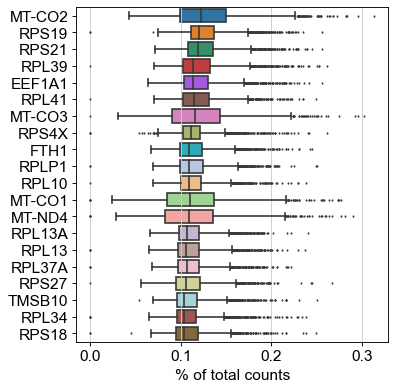

In [10]:
sc.pl.highest_expr_genes(adata, n_top=20, )

## Manifold embedding and clustering based on transcriptional similarity

To embed and cluster the manifold encoded by transcriptional similarity, we proceed as in the standard clustering tutorial.

In [11]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
#sc.tl.leiden(adata, key_added="clusters")
sc.tl.leiden(adata, key_added="clusters_0.5", resolution = 0.5)

computing PCA
    on highly variable genes
/Applications/anaconda3/envs/py38/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:14)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)
running Leiden clustering
    finished: found 8 clusters and added
    'clusters_0.5', the cluster labels (adata.obs, categorical) (0:00:00)


We plot some covariates to check if there is any particular structure in the UMAP associated with total counts and detected genes.

__UMAP:__

* Data points are spread out on the plot showing several clusters
* Connections between clusters can be readily identified

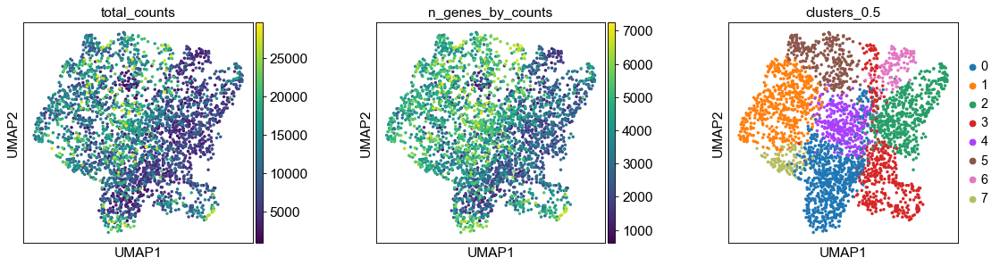

In [12]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "clusters_0.5"], wspace=0.4)

## Visualization in spatial coordinates

Let us now take a look at how total_counts and n_genes_by_counts behave in spatial coordinates. We will overlay the circular spots on top of the Hematoxylin and eosin stain (H&E) image provided, using the function sc.pl.spatial.

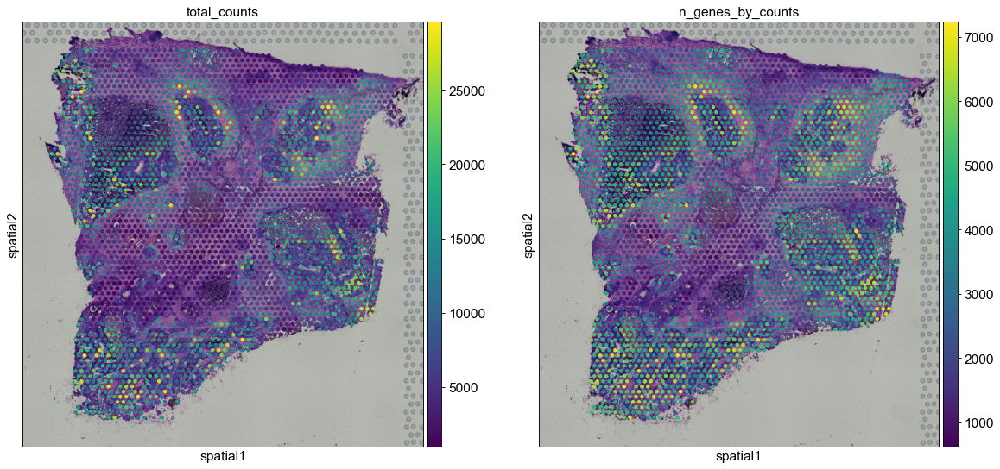

In [13]:
plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts"])

Before, we performed clustering in gene expression space, and visualized the results with UMAP. By visualizing clustered samples in spatial dimensions, we can gain insights into tissue organization and, potentially, into inter-cellular communication.

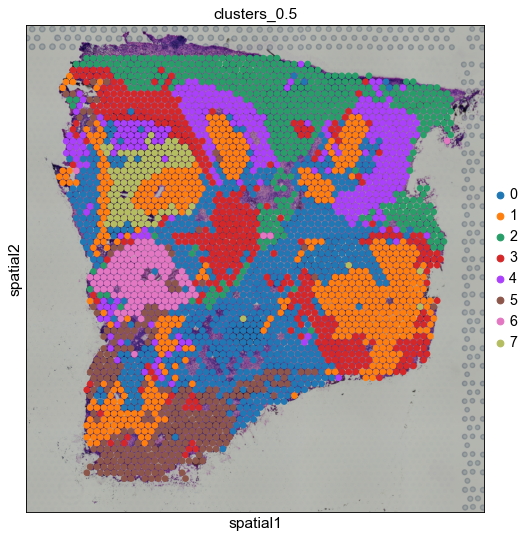

In [14]:
# sc.pl.spatial(adata, img_key="hires", color=["clusters", "clusters_0.5"], size=1.5)
sc.pl.spatial(adata, img_key="hires", color=["clusters_0.5"], size=1.5)

Spots belonging to cluster 9 are often surrounded by spots belonging to cluster 1. Spots belonging to cluster 6 are often surrounded by spots belonging to cluster 7. 

We can zoom in specific regions of interests to gain qualitative insights.

In [15]:
# sc.pl.spatial(adata, img_key="hires", color="clusters", groups=["1", "9"], crop_coord=[600, 1500, 1900, 1000], alpha=0.5, size=1.3)

## Cluster marker genes

Let us further inspect cluster 0, which occurs in small groups of spots across the image.
Compute marker genes and plot a heatmap with expression levels of its top 10 marker genes across clusters.

In [62]:
# sc.tl.rank_genes_groups(adata, "clusters", method="t-test")
sc.tl.rank_genes_groups(adata, "clusters_0.5", method="t-test")
#sc.tl.rank_genes_groups(adata, "clusters_0.5", method='wilcoxon')
#sc.tl.rank_genes_groups(adata, "clusters_0.5", method='logreg')
# sc.pl.rank_genes_groups_heatmap(adata, groups="9", n_genes=10, groupby="clusters")
#sc.pl.rank_genes_groups_heatmap(adata, groups="6", n_genes=10, groupby="clusters_0.5")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


We see that COL3A1 recapitulates the spatial structure.

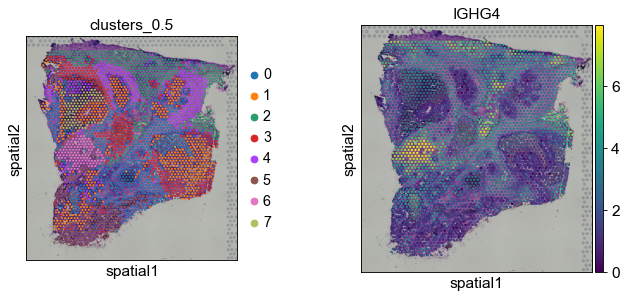

In [63]:
# sc.pl.spatial(adata, img_key="hires", color=["clusters", "COL3A1"])
sc.pl.spatial(adata, img_key="hires", color=["clusters_0.5", "IGHG4"])

# Compute spatial statistics with Moran's I

In [18]:
sq.gr.spatial_neighbors(adata, key_added='spatial')

Creating graph using `visium` coordinates and `None` transform
Adding `adata.obsp['spatial_connectivities']`
       `adata.uns['spatial_neighbors']`
Finish (0:00:00)


The results are saved in:

In [19]:
sq.gr.moran(adata, n_jobs=4, transformation = 'r')

/Applications/anaconda3/envs/py38/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Calculating for `2000` genes using `4` core(s)
/Applications/anaconda3/envs/py38/lib/python3.8/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)


  0%|          | 0/2000 [00:00<?, ?/s]

Adding `adata.uns['moranI']`
Finish (0:03:18)


In [20]:
adata.uns["moranI"].head(10)

,I,pval_sim,VI_sim,pval_sim_fdr_bh
IGHG1,0.793157,0.0,0.000122,0.0
IGLC2,0.787492,0.0,0.000118,0.0
MT-ND3,0.728818,0.0,0.000122,0.0
MT-ND1,0.723281,0.0,0.000122,0.0
MT-CO3,0.719756,0.0,0.000122,0.0
MT-ND4,0.718705,0.0,0.000113,0.0
MT-ATP6,0.717442,0.0,0.000124,0.0
OLFM4,0.715340,0.0,0.000118,0.0
IGHG3,0.710642,0.0,0.000111,0.0
MT-CO1,0.703338,0.0,0.000115,0.0


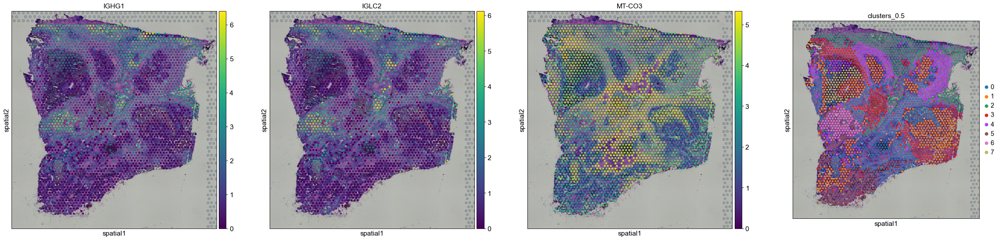

In [21]:
sc.pl.spatial(adata, img_key="hires",  color=["IGHG1", "IGLC2", "MT-CO3", "clusters_0.5"])

In [22]:
adata

AnnData object with n_obs × n_vars = 3028 × 17180
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'clusters_0.5'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'spatial', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'clusters_0.5_colors', 'rank_genes_groups', 'spatial_neighbors', 'moranI'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities', 'spatial_connectivities'

In [64]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']})

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,5_n,5_p,6_n,6_p,7_n,7_p
0,MT-ND1,4.017290e-304,RPS4X,1.614288e-112,IGKC,0.000000e+00,CTSB,1.306945e-103,DEFA5,4.782697e-77,CEACAM6,4.828666e-77,IGHG4,1.150393e-71,CKB,4.176533e-66
1,MT-CO1,5.386019e-308,RPS6,4.454057e-80,IGHG1,5.532161e-273,CD74,4.587409e-100,PRDX5,2.026072e-56,KRT19,8.811194e-36,AEBP1,1.355878e-65,RPL8,1.078054e-65
2,MT-ND4,1.275736e-310,PIGR,8.221160e-75,IGHG4,5.848275e-277,B2M,8.469335e-91,RPS21,8.475456e-53,KRT8,4.246711e-29,IGHG1,1.764131e-56,ID1,1.284039e-48
3,MT-ND2,1.702262e-282,RPS3A,2.763750e-73,COL1A2,3.969582e-221,IFI30,6.573474e-80,EEF1G,1.142590e-52,S100A4,3.371334e-28,IGLC2,1.609484e-54,FABP1,1.739301e-45
4,MT-CYB,3.229624e-295,RPL36A,3.652285e-74,COL1A1,1.070412e-214,APOC1,1.525468e-78,RPS19,1.691298e-44,KRT18,5.839228e-28,MYL9,4.984894e-52,RPL7A,1.886481e-51
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17175,IGLC3,6.732410e-50,MT-CO1,2.145451e-232,PABPC1,7.624406e-40,CCDC88B,3.926462e-14,MFGE8,2.159368e-14,MT-CO2,1.646811e-80,GDAP2,4.710825e-73,CD84,1.162173e-43
17176,C3,9.547970e-50,MT-CYB,1.435740e-240,CD24,8.869276e-41,CDHR1,2.002775e-15,MZB1,1.914299e-15,MT-ND2,1.563676e-84,SPINK4,2.172364e-74,FN1,3.334067e-27
17177,MMP2,2.826331e-51,MT-ND4,6.835915e-258,MAL2,1.979020e-43,PRAP1,2.067243e-16,MALAT1,9.092940e-17,MT-ND1,6.399530e-93,KLK11,1.654271e-77,AEBP1,2.738075e-33
17178,IGHG2,2.627491e-57,MT-CO3,2.184340e-253,RPL7,3.064642e-45,RPS4X,1.506688e-20,LGALS1,1.618388e-18,MT-ND3,4.513759e-92,ORC6,5.675178e-84,ARHGAP42,3.454137e-52


In [65]:
adata.uns['rank_genes_groups'].keys()

dict_keys(['params', 'names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges'])

# Filter for significant Marker genes

In [66]:
marker_genes = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals_adj']})
marker_genes

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,5_n,5_p,6_n,6_p,7_n,7_p
0,MT-ND1,2.300568e-300,RPS4X,7.111144e-110,IGKC,0.000000e+00,CTSB,2.245332e-99,DEFA5,8.216673e-73,CEACAM6,1.036956e-73,IGHG4,3.293958e-68,CKB,7.175284e-62
1,MT-CO1,4.626590e-304,RPS6,1.366441e-77,IGHG1,3.168084e-269,CD74,3.940584e-96,PRDX5,1.740395e-52,KRT19,6.055052e-33,AEBP1,2.329399e-62,RPL8,9.260486e-62
2,MT-ND4,2.191714e-306,PIGR,2.315402e-72,IGHG4,5.023668e-273,B2M,4.850106e-87,RPS21,4.853611e-49,KRT8,2.428530e-26,IGHG1,2.164841e-53,ID1,3.676631e-45
3,MT-ND2,4.177838e-279,RPS3A,7.418941e-71,COL1A2,1.704935e-217,IFI30,2.258646e-76,EEF1G,4.907422e-49,S100A4,1.703515e-25,IGLC2,1.843395e-51,FABP1,3.735150e-42
4,MT-CYB,1.387123e-291,RPL36A,9.959722e-72,COL1A1,3.677934e-211,APOC1,3.743933e-75,RPS19,5.811298e-41,KRT18,2.866227e-25,MYL9,4.507394e-49,RPL7A,8.102437e-48
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17175,IGLC3,6.425711e-47,MT-CO1,3.685885e-229,PABPC1,2.220124e-37,CCDC88B,3.876817e-12,MFGE8,5.081910e-12,MT-CO2,5.658443e-77,GDAP2,1.618639e-69,CD84,1.996612e-40
17176,C3,8.501326e-47,MT-CYB,2.740668e-237,CD24,2.770439e-38,CDHR1,2.219849e-13,MZB1,4.982977e-13,MT-ND2,6.715990e-81,SPINK4,9.330304e-71,FN1,8.182754e-25
17177,MMP2,2.856256e-48,MT-ND4,1.677729e-254,MAL2,6.666582e-41,PRAP1,2.432551e-14,MALAT1,2.789584e-14,MT-ND1,5.497196e-89,KLK11,9.473458e-74,AEBP1,1.470004e-30
17178,IGHG2,3.009354e-54,MT-CO3,4.690870e-250,RPL7,1.144577e-42,RPS4X,2.331973e-18,LGALS1,5.792479e-16,MT-ND3,2.584880e-88,ORC6,4.874977e-80,ARHGAP42,1.978069e-48


# Find significant SVG and marker genes

In [67]:
alpha = 0.05
#significant_SVG = np.array(adata.uns["moranI"][adata.uns["moranI"]['pval_sim'] < alpha].index.values)
significant_SVG = np.array(adata.uns["moranI"][adata.uns["moranI"]['pval_sim_fdr_bh'] < alpha].index.values)
#significant_SVG
#len(significant_SVG)

number_of_clusters = int(len(marker_genes.columns)/2)

significant_marker_genes = {}
for number in [str(int) for int in range(0, number_of_clusters)]:
    significant_marker_genes["cluster %s" %number] = np.array(marker_genes.loc[marker_genes[number + '_p'] < alpha, number + '_n']).tolist()

number_of_significant_genes_per_cluster = {k:len(v) for k, v in significant_marker_genes.items()}
number_of_significant_genes_per_cluster = pd.DataFrame.from_dict(number_of_significant_genes_per_cluster, orient='index',
                       columns=['number of significant marker genes'])
number_of_significant_genes_per_cluster

,number of significant marker genes
cluster 0,4006
cluster 1,8001
cluster 2,7730
cluster 3,2735
cluster 4,2638
cluster 5,4352
cluster 6,6692
cluster 7,3892


# Find overlapping genes and Rank cluster

In [70]:
overlapping_genes = {}
for number in [str(int) for int in range(0, number_of_clusters)]:
    marker = pd.DataFrame(significant_marker_genes['cluster ' + number], columns=['genes'])
    overlapping_genes["cluster %s" %number] = marker.loc[marker['genes'].isin(significant_SVG)]

number_of_overlapping_genes_per_cluster = {k:len(v) for k, v in overlapping_genes.items()}
number_of_overlapping_genes_per_cluster = pd.DataFrame.from_dict(number_of_overlapping_genes_per_cluster, orient='index',
                       columns=['number of overlapping marker genes'])

number_of_overlapping_genes_per_cluster
number_of_overlapping_genes_per_cluster.sort_values(by=['number of overlapping marker genes'], ascending=False)


,number of overlapping marker genes
cluster 1,800
cluster 2,679
cluster 0,622
cluster 7,574
cluster 6,493
cluster 3,479
cluster 5,453
cluster 4,381


In [69]:
percentage_of_overlapping_genes = number_of_overlapping_genes_per_cluster.div(number_of_significant_genes_per_cluster.values).rename(columns={'number of overlapping marker genes': 'percentage of overlapping marker genes'})
percentage_of_overlapping_genes.sort_values(by=['percentage of overlapping marker genes'], ascending=False)

,percentage of overlapping marker genes
cluster 3,0.175137
cluster 0,0.155267
cluster 7,0.147482
cluster 4,0.144428
cluster 5,0.104090
cluster 1,0.099988
cluster 2,0.087840
cluster 6,0.073670


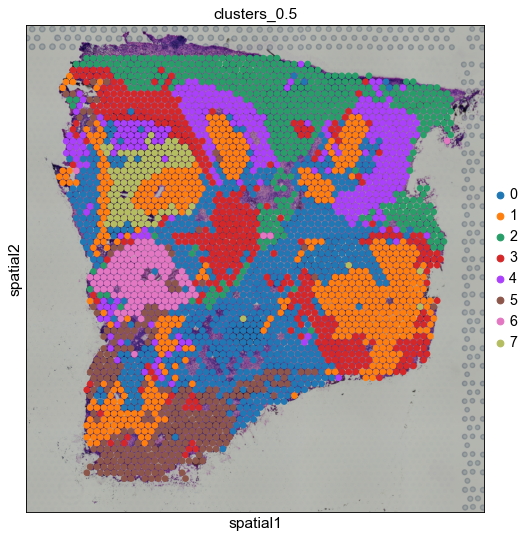

In [29]:
sc.pl.spatial(adata, img_key="hires", color=["clusters_0.5"], size=1.5)

/Applications/anaconda3/envs/py38/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_clusters_0.5']`
categories: 0, 1, 2, etc.
var_group_labels: 6


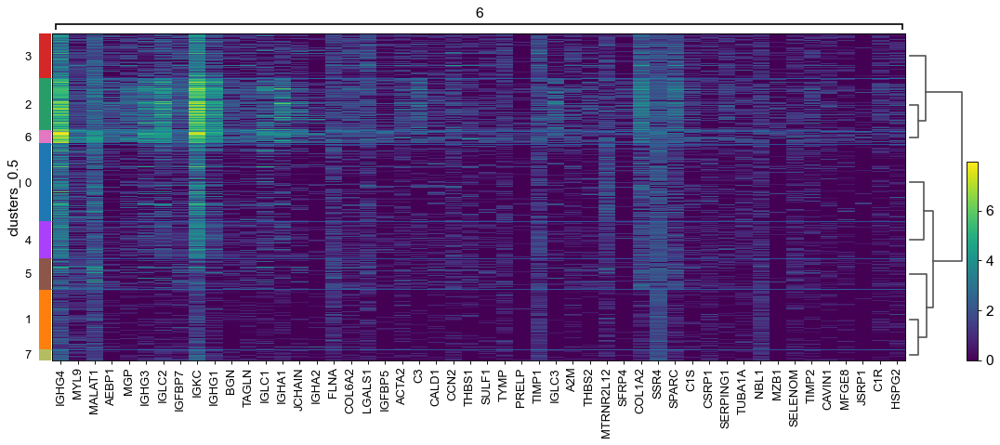

,genes
1,MYL9
2,MALAT1
3,AEBP1
4,MGP
5,IGHG3
6,IGLC2
7,IGFBP7
9,IGHG1
10,BGN
11,TAGLN


In [30]:
sc.pl.rank_genes_groups_heatmap(adata, groups="6", n_genes=50, groupby="clusters_0.5")
overlapping_genes["cluster 6"].head(20)

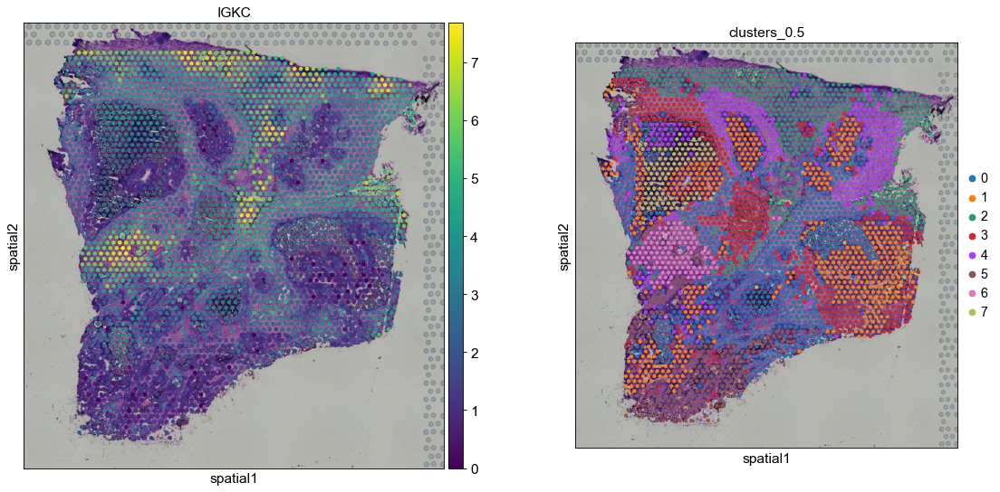

In [31]:
sc.pl.spatial(adata, img_key="hires",  color=["IGKC", "clusters_0.5"])

/Applications/anaconda3/envs/py38/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
categories: 0, 1, 2, etc.
var_group_labels: 0


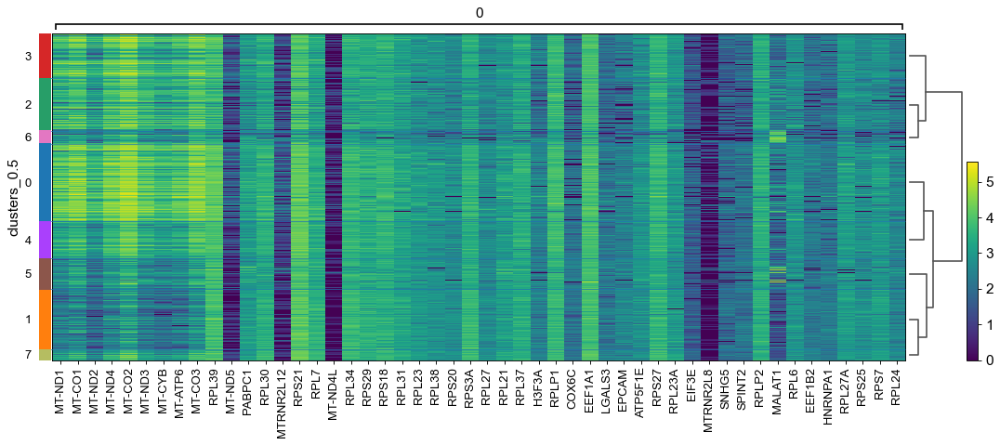

,genes
0,MT-ND1
1,MT-CO1
2,MT-ND2
3,MT-ND4
5,MT-ND3
6,MT-CYB
7,MT-ATP6
8,MT-CO3
10,MT-ND5
13,MTRNR2L12


In [32]:
sc.pl.rank_genes_groups_heatmap(adata, groups="0", n_genes=50, groupby="clusters_0.5")
overlapping_genes["cluster 0"].head(20)

/Applications/anaconda3/envs/py38/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
categories: 0, 1, 2, etc.
var_group_labels: 1


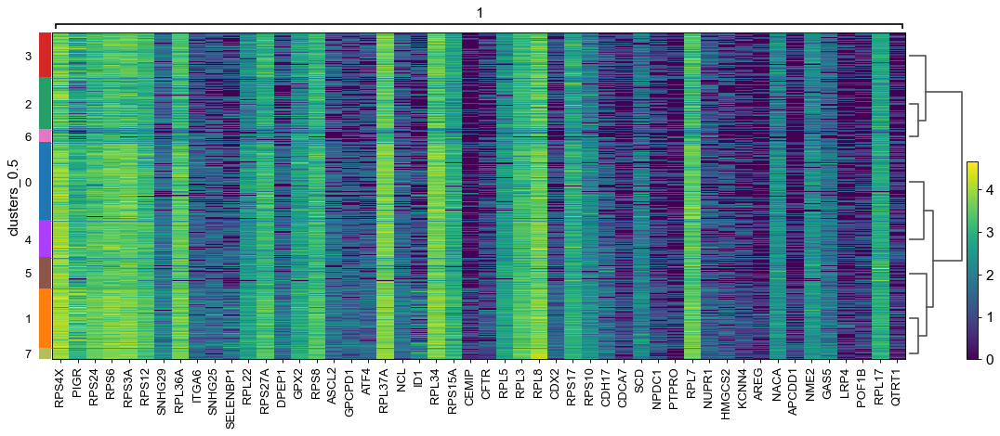

,genes
1,PIGR
10,SELENBP1
21,ID1
66,CKB
305,FCGBP
363,ALYREF
475,BCL11A
534,NDRG1
543,LRRC75A
546,CCDC88B


In [33]:
sc.pl.rank_genes_groups_heatmap(adata, groups="1", n_genes=50, groupby="clusters_0.5")
overlapping_genes["cluster 1"].head(20)

/Applications/anaconda3/envs/py38/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
categories: 0, 1, 2, etc.
var_group_labels: 2


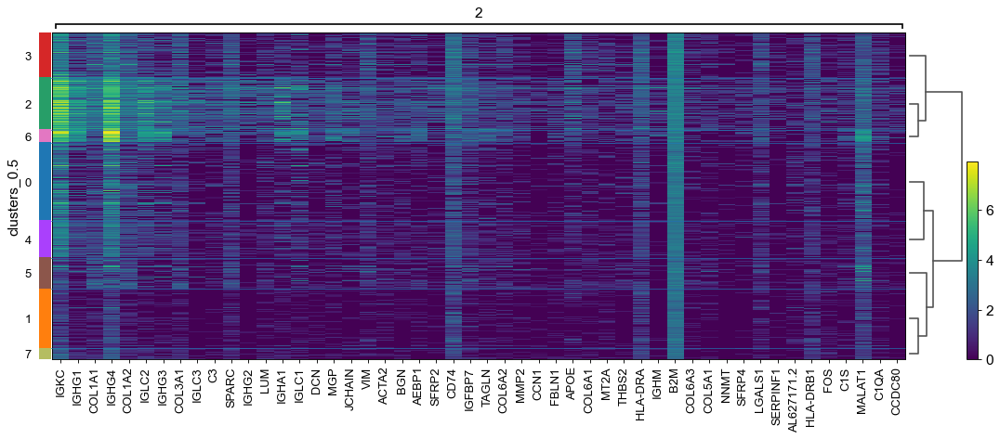

,genes
1,IGHG1
2,COL1A1
4,COL1A2
5,IGLC2
6,IGHG3
7,COL3A1
8,IGLC3
9,C3
10,SPARC
11,IGHG2


In [34]:
sc.pl.rank_genes_groups_heatmap(adata, groups="2", n_genes=50, groupby="clusters_0.5")
overlapping_genes["cluster 2"].head(20)

/Applications/anaconda3/envs/py38/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
categories: 0, 1, 2, etc.
var_group_labels: 3


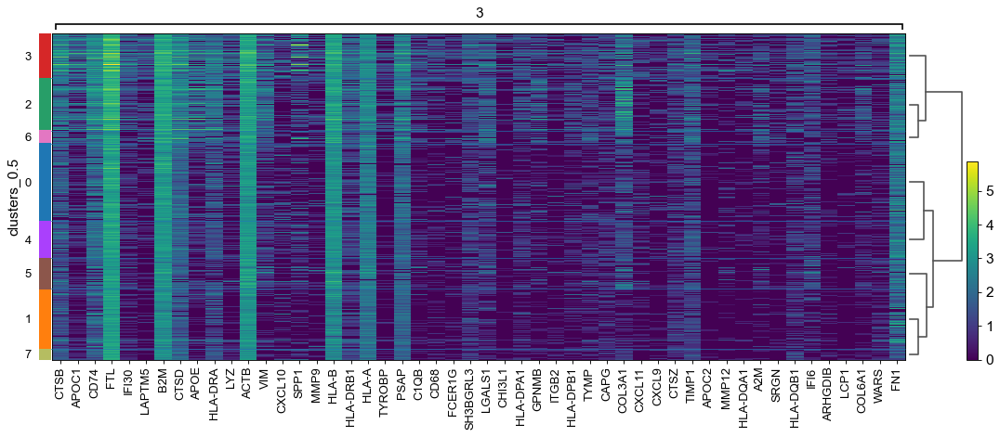

,genes
0,CTSB
1,APOC1
2,CD74
3,FTL
4,IFI30
5,LAPTM5
7,CTSD
8,APOE
9,HLA-DRA
10,LYZ


In [35]:
sc.pl.rank_genes_groups_heatmap(adata, groups="3", n_genes=50, groupby="clusters_0.5")
overlapping_genes["cluster 3"].head(20)

/Applications/anaconda3/envs/py38/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
categories: 0, 1, 2, etc.
var_group_labels: 4


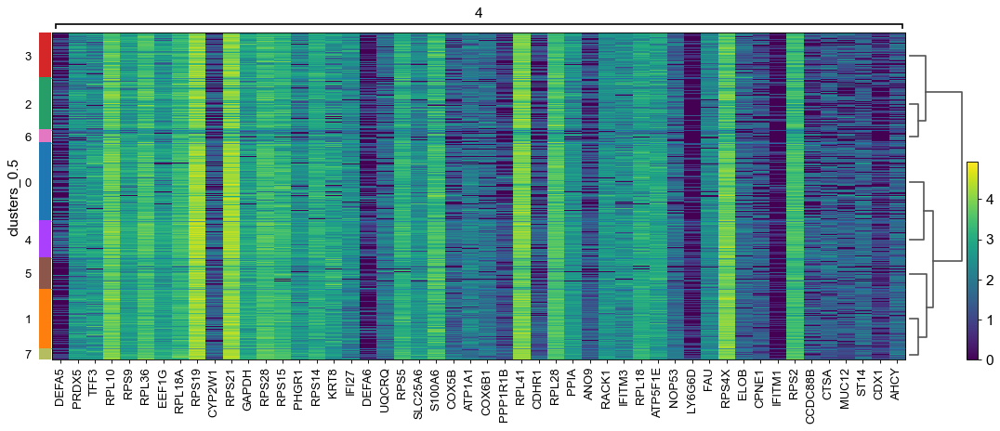

,genes
0,DEFA5
16,KRT8
18,DEFA6
44,CCDC88B
86,AC078993.1
264,IGHG1
363,PIGR
502,AQP1
507,BCL11A
510,IGLC2


In [36]:
sc.pl.rank_genes_groups_heatmap(adata, groups="4", n_genes=50, groupby="clusters_0.5")
overlapping_genes["cluster 4"].head(20)

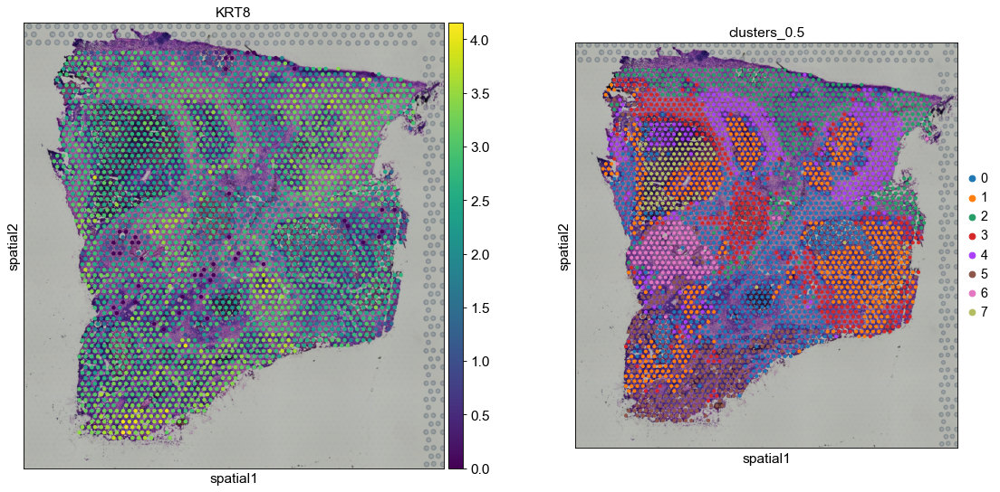

In [37]:
#sc.pl.rank_genes_groups_heatmap(adata, groups="5", n_genes=50, groupby="clusters_0.5")
#overlapping_genes["cluster 5"].head(20)
sc.pl.spatial(adata, color = ['KRT8', 'clusters_0.5'])

/Applications/anaconda3/envs/py38/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
categories: 0, 1, 2, etc.
var_group_labels: 7


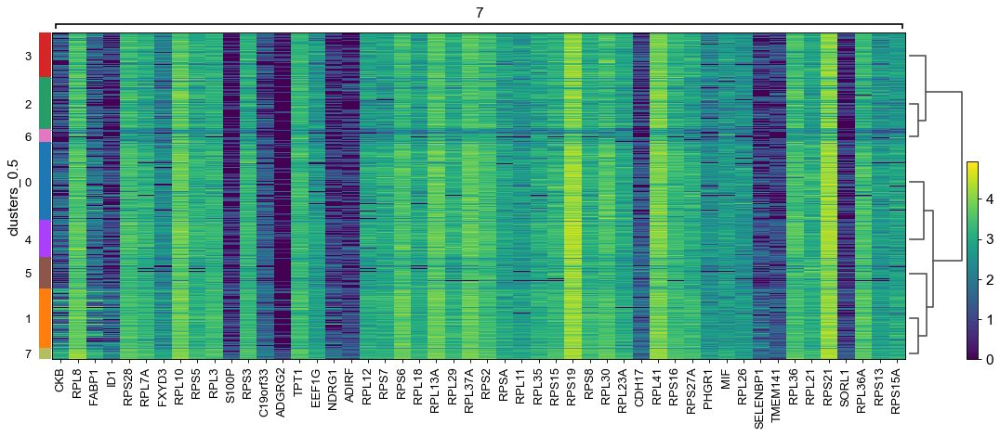

,genes
0,CKB
3,ID1
13,ADGRG2
16,NDRG1
41,SELENBP1
106,CRIP1
117,EMP1
168,MUC1
270,SOD3
422,TUBA1A


In [38]:
sc.pl.rank_genes_groups_heatmap(adata, groups="7", n_genes=50, groupby="clusters_0.5")
overlapping_genes["cluster 7"].head(20)

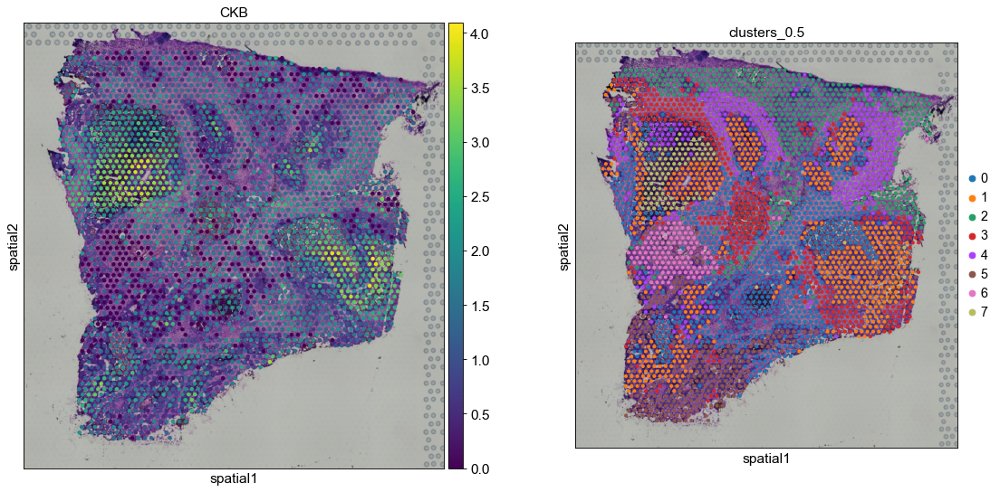

In [39]:
sc.pl.spatial(adata, img_key="hires",  color=["CKB", "clusters_0.5"])

/Applications/anaconda3/envs/py38/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


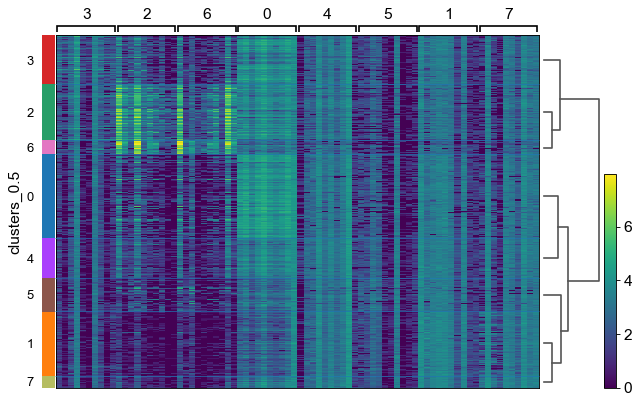

In [40]:
sc.pl.rank_genes_groups_heatmap(adata, groups=['0', '1', '2', '3', '4', '5', '6', '7'], n_genes=10, groupby="clusters_0.5")

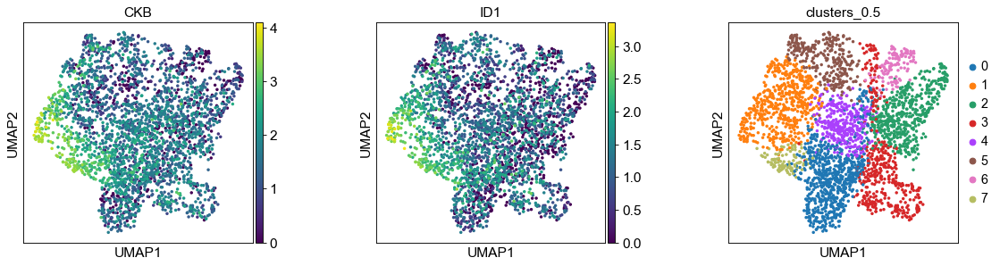

In [41]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["CKB", "ID1", "clusters_0.5"], wspace=0.4)

In [43]:
marker_genes = ['IL7R', 'CD79A', 'MS4A1', 'CD8A', 'CD8B', 'LYZ', 'CD14',
                'LGALS3', 'S100A8', 'GNLY', 'NKG7', 'KLRB1',
                'FCGR3A', 'MS4A7', 'CST3', "clusters_0.5"]

In [44]:
# Check if marker genes are still in andata object
np.in1d(marker_genes, adata.var_names)

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True, False])

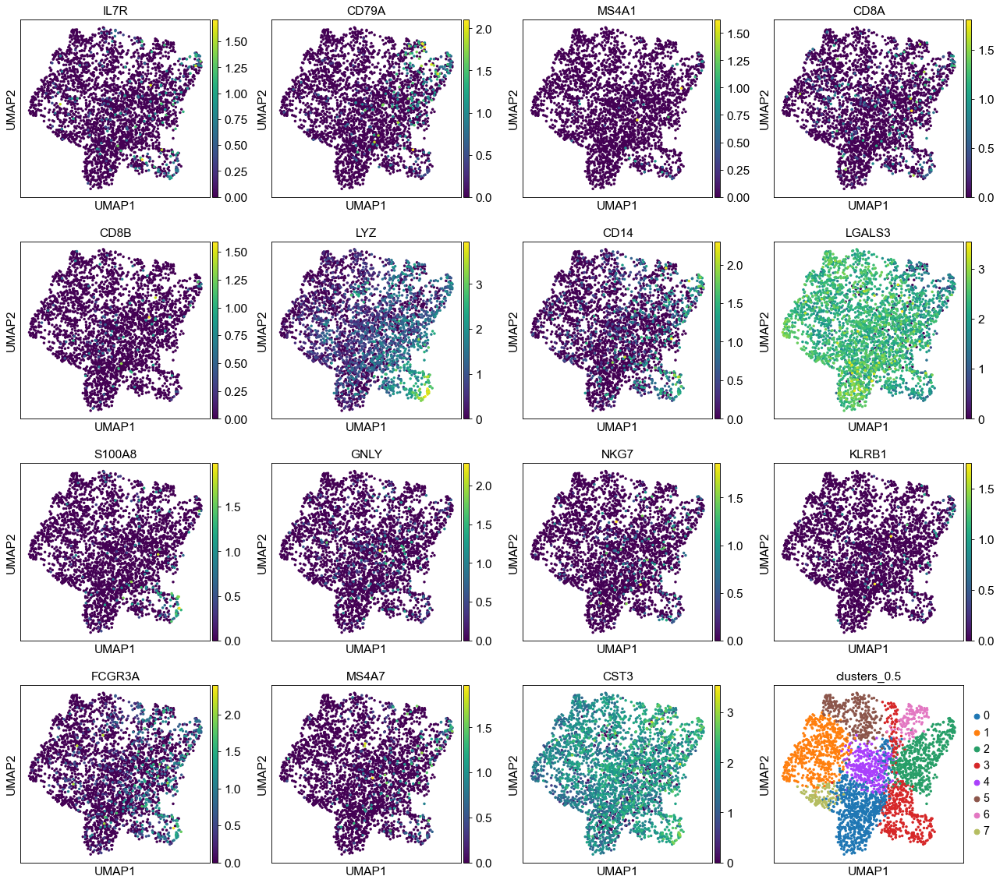

In [45]:
sc.pl.umap(adata=adata, color=marker_genes, use_raw=False)

running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


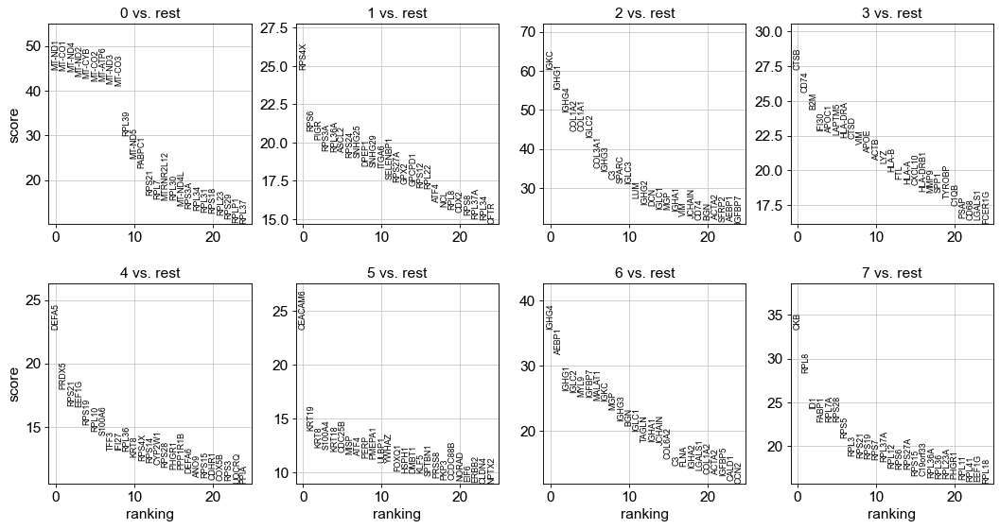

In [46]:
sc.tl.leiden(adata, resolution = 0.5)
#sc.tl.leiden(adata)
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


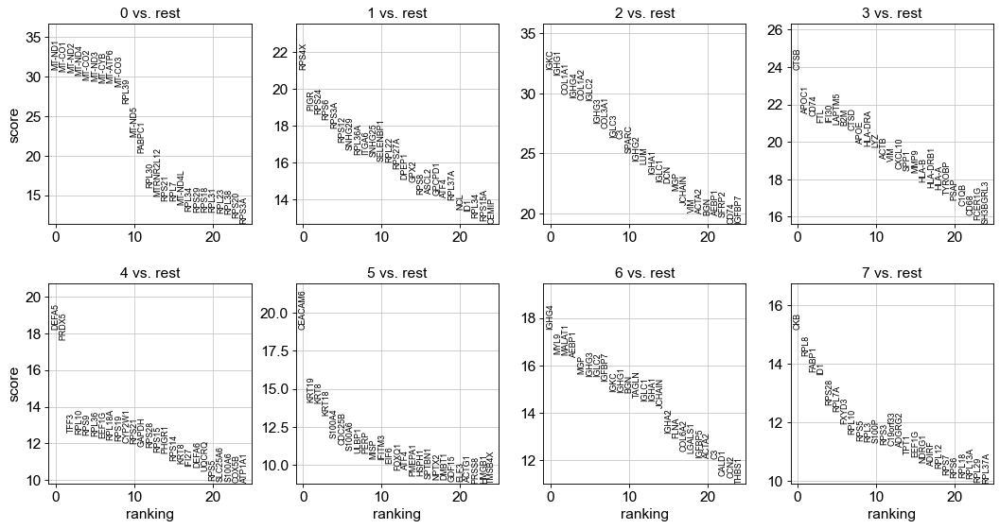

In [47]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

ranking genes
/Applications/anaconda3/envs/py38/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:19)


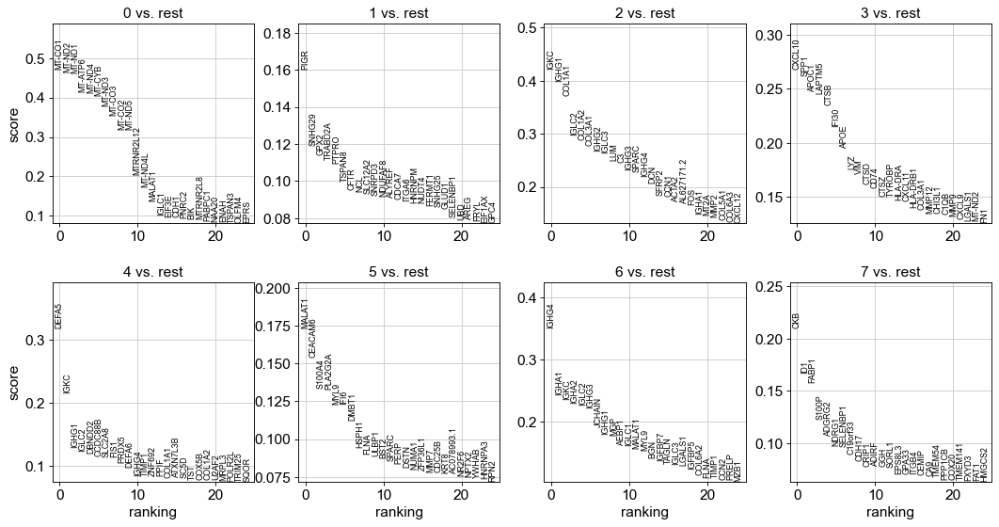

In [48]:
sc.tl.rank_genes_groups(adata, 'leiden', method='logreg')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [49]:
#sc.pl.violin(adata, ['IL7R', 'CD14', 'LYZ', 'MS4A1', 'CD8A', 'GNLY', 'NKG7', 'FCGR3A', 'MS4A7', 'CST3'], groupby='leiden')

/Applications/anaconda3/envs/py38/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


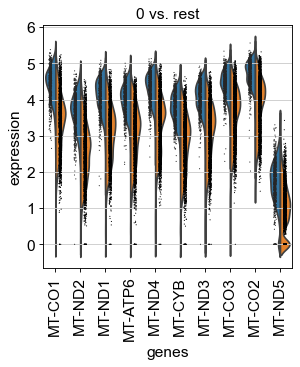

In [50]:
sc.pl.rank_genes_groups_violin(adata, groups='0', n_genes=10)

# List of markergenes 

In [51]:
list_of_marker_genes = pd.DataFrame({'Marker Gene': ['MT-ND1, MT-CO1',
                                                    'PIGR, SELENBP1',
                                                    'COL1A1, COL1A2',
                                                    'CTSB, FTL',
                                                    'DEFA5, DEFA6',
                                                    'KRT8, DMBT1',
                                                    'AEBP1, MYL9',
                                                    'CKB, ADGRG2'], 
                                   'Cell Type': ['Cardiomyocytes',
                                                 'Enterocytes, Paneth cells',
                                                 'Fibroblasts, Ito cells',
                                                 'Hofbauer cells, Kupffer cells',
                                                 'Mucus-secreting cells',
                                                 'Syncytiotrophoblasts, Alveolar cells type 2',
                                                 'Peritubular cells, Smooth muscle cells',
                                                 'Horizontal cells, Muller glia cells']}, 
                                   index = ['cluster 0',
                                          'cluster 1',
                                          'cluster 2',
                                          'cluster 3',
                                          'cluster 4',
                                          'cluster 5',
                                          'cluster 6',
                                          'cluster 7'])
list_of_marker_genes

,Marker Gene,Cell Type
cluster 0,"MT-ND1, MT-CO1",Cardiomyocytes
cluster 1,"PIGR, SELENBP1","Enterocytes, Paneth cells"
cluster 2,"COL1A1, COL1A2","Fibroblasts, Ito cells"
cluster 3,"CTSB, FTL","Hofbauer cells, Kupffer cells"
cluster 4,"DEFA5, DEFA6",Mucus-secreting cells
cluster 5,"KRT8, DMBT1","Syncytiotrophoblasts, Alveolar cells type 2"
cluster 6,"AEBP1, MYL9","Peritubular cells, Smooth muscle cells"
cluster 7,"CKB, ADGRG2","Horizontal cells, Muller glia cells"


In [52]:
marker_genes = ['MT-ND1','MT-CO1','PIGR','SELENBP1','COL1A1','COL1A2','CTSB',
                'FTL','DEFA5','DEFA6','KRT8','DMBT1','AEBP1','MYL9','CKB','ADGRG2']

In [53]:
new_cluster_names = ['Cardiomyocytes',
    'Enterocytes',
    'Fibroblasts',
    'Hofbauer cells',
    'Mucus-secreting cells',
    'Syncytiotrophoblasts',
    'Peritubular cells',
    'Muller glia cells']
adata.rename_categories('leiden', new_cluster_names)

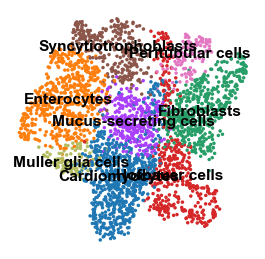

In [54]:
sc.pl.umap(adata, color='leiden', legend_loc='on data', title='', frameon=False, save='.pdf')

In [55]:
sc.pl.dotplot(adata, marker_gene, groupby='leiden');

NameError: name 'marker_gene' is not defined

/Applications/anaconda3/envs/py38/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


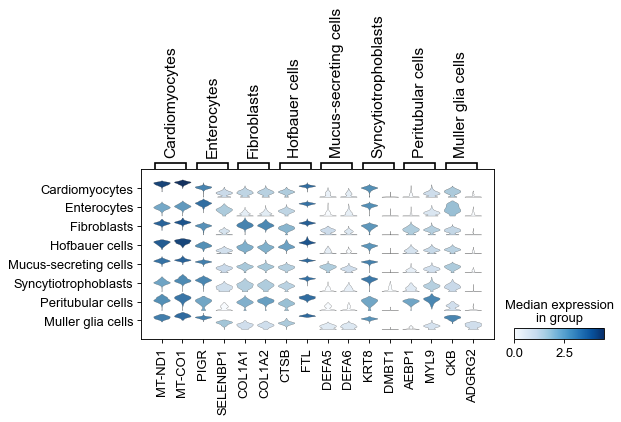

In [58]:
sc.pl.stacked_violin(adata, marker_gene, groupby='leiden', rotation=90);

In [61]:
marker_genes_dict = {'NK': ['GNLY', 'NKG7'],
                     'T-cell': ['CD3D'],
                     'B-cell': ['CD79A', 'MS4A1'],
                     'Monocytes': ['FCGR3A'],
                     'Dendritic': ['CST3'], 
                    'CD4 T cells': ['IL7R'], 
                    'CD14+ Monocytes': ['CD14', 'LYZ'], 
                    'CD8 T cells': ['CD8A'], 
                    'FCGR3A+ Monocytes': ['FCGR3A', 'MS4A7']}
pd.DataFrame(marker_genes_dict)

ValueError: arrays must all be same length

/Applications/anaconda3/envs/py38/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
categories: 0, 1, 2, etc.
var_group_labels: NK, T-cell, B-cell, etc.


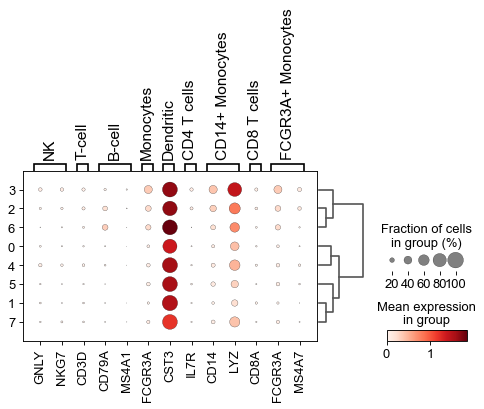

In [59]:
sc.pl.dotplot(adata, marker_genes_dict, 'clusters_0.5', dendrogram=True)

/Applications/anaconda3/envs/py38/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
categories: 0, 1, 2, etc.
var_group_labels: NK, T-cell, B-cell, etc.


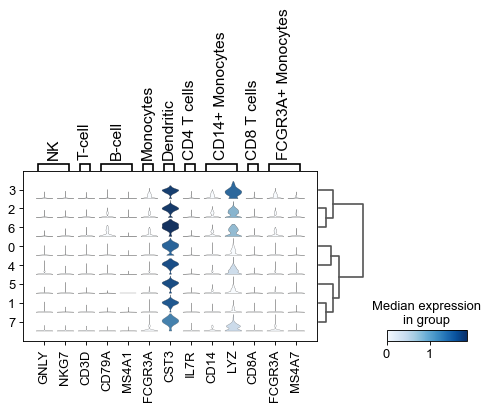

In [60]:
sc.pl.stacked_violin(adata, marker_genes_dict, groupby='clusters_0.5', swap_axes=False, dendrogram=True)

/Applications/anaconda3/envs/py38/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
categories: 0, 1, 2, etc.
var_group_labels: Cardiomyocytes, Enterocytes, Fibroblasts, etc.


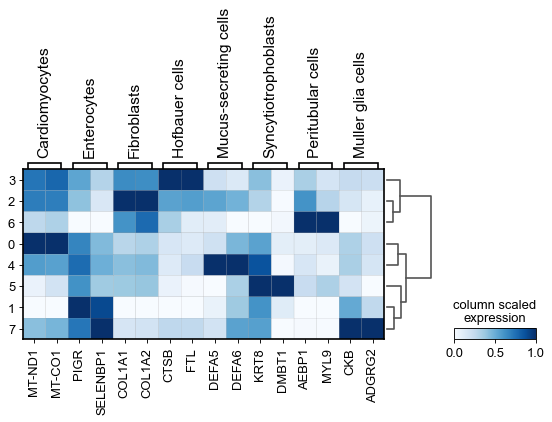

In [56]:
marker_gene = {'Cardiomyocytes': ['MT-ND1', 'MT-CO1'],
                'Enterocytes': ['PIGR', 'SELENBP1'],
                'Fibroblasts': ['COL1A1', 'COL1A2'],
                'Hofbauer cells': ['CTSB','FTL'],
                'Mucus-secreting cells': ['DEFA5', 'DEFA6'],
                'Syncytiotrophoblasts': ['KRT8', 'DMBT1'],
                'Peritubular cells': ['AEBP1', 'MYL9'],
                'Muller glia cells': ['CKB', 'ADGRG2']}
sc.pl.matrixplot(adata, marker_gene, 'clusters_0.5', dendrogram=True, cmap='Blues', standard_scale='var', colorbar_title='column scaled\nexpression')

In [ ]:
ax = sc.pl.heatmap(adata, marker_gene, groupby='clusters_0.5', cmap='viridis', dendrogram=True)